<a href="https://colab.research.google.com/github/AdelabuAderonke/DNNLS-Multimodal-Sequence-Modeling/blob/main/experiment_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

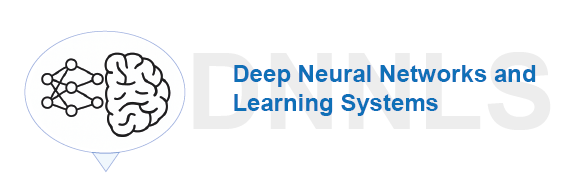

# Final assessment - Main Notebook
---

**Introduction:**

In this notebook you will find a baseline, functional architecture for your assessment task.

In [2]:
# @title Importing the necessary libraries
import torch
import torch.nn as nn
import torch.nn.functional as F

from bs4 import BeautifulSoup
import re
import matplotlib.pyplot as plt
import numpy as np

from google.colab import drive
import os

from datasets import load_dataset

from datasets.fingerprint import random
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.transforms.functional as FT

from transformers import BertTokenizer
import gc

import textwrap


# **Chapter 1: The data preparation**


---



First we need to activate our google drive so that we can save out data permanently.

## 1.1 Loading and saving data

In [3]:
# @title Setting up google drive to save checkpoints

# This will prompt you to authorize Google Drive access
drive.mount('/content/gdrive')

def save_checkpoint_to_drive(model, optimizer, epoch, loss, filename="autoencoder_checkpoint.pth"):
    """
    Saves the checkpoint directly to a specified folder in your mounted Google Drive.
    """
    # 1. Define the full Google Drive path
    # 'DL_Checkpoints' is the folder you want to save to inside your Drive
    drive_folder = '/content/gdrive/MyDrive/DL_Checkpoints'

    # Ensure the directory exists before attempting to save
    os.makedirs(drive_folder, exist_ok=True)

    # 2. Combine the folder and the filename
    full_path = os.path.join(drive_folder, filename)

    # 3. Create the checkpoint dictionary
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }

    # 4. Save the dictionary to the Google Drive path
    torch.save(checkpoint, full_path)
    print(f"Checkpoint saved to Google Drive: {full_path} at epoch {epoch}")


def load_checkpoint_from_drive(model, optimizer=None, filename="autoencoder_checkpoint.pth"):
    """
    Loads a checkpoint from your Google Drive folder into the model and optimizer (if provided).
    """
    # Define the same Google Drive folder path
    drive_folder = '/content/gdrive/MyDrive/DL_Checkpoints'
    full_path = os.path.join(drive_folder, filename)

    # Check if the checkpoint file exists
    if not os.path.exists(full_path):
        raise FileNotFoundError(f"Checkpoint file not found: {full_path}")

    # Load the checkpoint
    checkpoint = torch.load(full_path, map_location=torch.device('cpu'))  # use cuda if available

    # Restore model state
    model.load_state_dict(checkpoint['model_state_dict'])

    # Restore optimizer state (if provided)
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    # Extract metadata
    epoch = checkpoint.get('epoch', 0)
    loss = checkpoint.get('loss', None)

    print(f"Checkpoint loaded from: {full_path} (epoch {epoch})")

    return model, optimizer, epoch, loss


Mounted at /content/gdrive


We need to define a couple of functions to make our life easier. Feel free to tweak those functions:

In [4]:
# @title Functions to load images and process data


# This function just extracts the tags from the text, don't get distracted by it.
# I changed this function a bit to fix some bugs
def parse_gdi_text(text):
    """Parse GDI formatted text into structured data"""
    soup = BeautifulSoup(text, 'html.parser')
    images = []

    for gdi in soup.find_all('gdi'):
        # Debug: print what BeautifulSoup sees

        # Method 1: Try to get image attribute directly
        image_id = None
        if gdi.attrs:
            # Check for attributes like 'image1', 'image2', etc.
            for attr_name, attr_value in gdi.attrs.items():
                if 'image' in attr_name.lower():
                    image_id = attr_name.replace('image', '')
                    break

        # Method 2: Extract from the tag string using regex
        if not image_id:
            tag_str = str(gdi)
            match = re.search(r'<gdi\s+image(\d+)', tag_str)
            if match:
                image_id = match.group(1)

        # Method 3: Fallback - use sequential numbering
        if not image_id:
            image_id = str(len(images) + 1)

        content = gdi.get_text().strip()

        # Extract tagged elements using BeautifulSoup directly
        objects = [obj.get_text().strip() for obj in gdi.find_all('gdo')]
        actions = [act.get_text().strip() for act in gdi.find_all('gda')]
        locations = [loc.get_text().strip() for loc in gdi.find_all('gdl')]

        images.append({
            'image_id': image_id,
            'description': content,
            'objects': objects,
            'actions': actions,
            'locations': locations,
            'raw_text': str(gdi)
        })

    return images

# This is an utility function to show images.
# Why do we need to do all this?
def show_image(ax, image, de_normalize = False, img_mean = None, img_std = None):
  """
  De-normalize the image (if necessary) and show image
  """
  if de_normalize:
    new_mean = -img_mean/img_std
    new_std = 1/img_std

    image = transforms.Normalize(
        mean=new_mean,
        std=new_std
    )(image)
  ax.imshow(image.permute(1, 2, 0))



Now we load dataset from HuggingFace:

In [5]:
# @title Loading the dataset
train_dataset = load_dataset("daniel3303/StoryReasoning", split="train")
test_dataset = load_dataset("daniel3303/StoryReasoning", split="test")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00002.parquet:   0%|          | 0.00/327M [00:00<?, ?B/s]

data/train-00001-of-00002.parquet:   0%|          | 0.00/331M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/115M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3552 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/626 [00:00<?, ? examples/s]

In a previous lab, we analyzed the statistics of the images and figure out that a size of 240x500 could be good enough to standarize, but we will use 60x125. Also, we will restrict ourselves to taking only 5 frames from all the sequences.


## 1.2 Three datasets


---



We will create three different dataset objects and the corresponding loaders for performing multiple tasks

In [6]:
# @title Main dataset
class SequencePredictionDataset(Dataset):
    def __init__(self, original_dataset, tokenizer):
        super(SequencePredictionDataset, self).__init__()
        self.dataset = original_dataset
        self.tokenizer = tokenizer
        # Potential experiments: Try other transforms!
        self.transform = transforms.Compose([
          transforms.Resize((60, 125)),# Reasonable size based on our previous analysis
          transforms.ToTensor(), # HxWxC -> CxHxW
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
      """
      Selects a 5 frame sequence from the dataset. Sets 4 for training and the last one
      as a target.
      """
      num_frames = self.dataset[idx]["frame_count"]
      frames = self.dataset[idx]["images"]
      self.image_attributes = parse_gdi_text(self.dataset[idx]["story"])

      frame_tensors = []
      description_list = []

      for frame_idx in range(4):
        image = FT.equalize(frames[frame_idx])
        input_frame = self.transform(image)
        frame_tensors.append(input_frame)

        # Potential experiments: Try using the other attributes in your training
        # objects = self.image_attributes[frame_idx]["objects"]
        # actions = self.image_attributes[frame_idx]["actions"]
        # locations = self.image_attributes[frame_idx]["locations"]

        description = self.image_attributes[frame_idx]["description"]
        # We need to return the tokens for NLP
        input_ids =  self.tokenizer(description,
                             return_tensors="pt",
                             padding="max_length",
                             truncation=True,
                             max_length=120).input_ids

        description_list.append(input_ids.squeeze(0))


      image_target = FT.equalize(frames[4])
      image_target = self.transform(image_target)
      text_target = self.image_attributes[4]["description"]

      target_ids = tokenizer(description,
                             return_tensors="pt",
                             padding="max_length",
                             truncation=True,
                             max_length=120).input_ids

      sequence_tensor = torch.stack(frame_tensors)  # shape: (num_frames, C, H, W)
      description_tensor = torch.stack(description_list) # (num_frames, max_length)

      return (sequence_tensor, # Returning the image
              description_tensor, # Returning the whole description
              image_target, # Image target
              target_ids) # Text target



We will use text autoencoding (reconstructing the same text) to develop representations of the text (I provide some existing weights for this, but you can train your own)

In [7]:
# @title Text task dataset (text autoencoding)
class TextTaskDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
      num_frames = self.dataset[idx]["frame_count"]
      self.image_attributes = parse_gdi_text(self.dataset[idx]["story"])

      # Pick
      frame_idx = np.random.randint(0, 5)
      description = self.image_attributes[frame_idx]["description"]

      return description  # Returning the whole description


And also a dataset for a potential image autoencoder task if you want to develop some visual features before training the whose archicture.

In [8]:
# @title Dataset for image autoencoder task
class AutoEncoderTaskDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.transform = transforms.Compose([
          transforms.Resize((240, 500)),# Reasonable size based on our previous analysis
          transforms.ToTensor(), # HxWxC -> CxHxW
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
      num_frames = self.dataset[idx]["frame_count"]
      frames = self.dataset[idx]["images"]

      # Pick a frame at random
      frame_idx = torch.randint(0, num_frames-1, (1,)).item()
      input_frame = self.transform(frames[frame_idx]) # Input to the autoencoder

      return input_frame, # Returning the image

## 1.3 Creating and testing our dataset objects and loaders


---



In [9]:
# @title For the Sequence prediction task
tokenizer = BertTokenizer.from_pretrained("google-bert/bert-base-uncased",  padding=True, truncation=True)
sp_train_dataset = SequencePredictionDataset(train_dataset, tokenizer) # Instantiate the train dataset
sp_test_dataset = SequencePredictionDataset(test_dataset, tokenizer) # Instantiate the test dataset

# Let's do things properly, we will also have a validation split
# Split the training dataset into training and validation sets
train_size = int(0.8 * len(sp_train_dataset))
val_size = len(sp_train_dataset) - train_size
train_subset, val_subset = random_split(sp_train_dataset, [train_size, val_size])

# Instantiate the dataloaders
train_dataloader = DataLoader(train_subset, batch_size=8, shuffle=True)
# We will use the validation set to visualize the progress.
val_dataloader = DataLoader(val_subset, batch_size=4, shuffle=True)
test_dataloader = DataLoader(sp_test_dataset, batch_size=4, shuffle=False)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [10]:
# @title For the text task
tokenizer = BertTokenizer.from_pretrained("google-bert/bert-base-uncased",  padding=True, truncation=True)
text_dataset = TextTaskDataset(train_dataset)
text_dataloader = DataLoader(text_dataset, batch_size=4, shuffle=True)

In [11]:
# @title For the image autoencoder task
autoencoder_dataset = AutoEncoderTaskDataset(train_dataset)
autoencoder_dataloader = DataLoader(autoencoder_dataset, batch_size=4, shuffle=True)

Description:  torch.Size([4, 120])
torch.Size([8, 4, 3, 60, 125])
torch.Size([8, 4, 120])


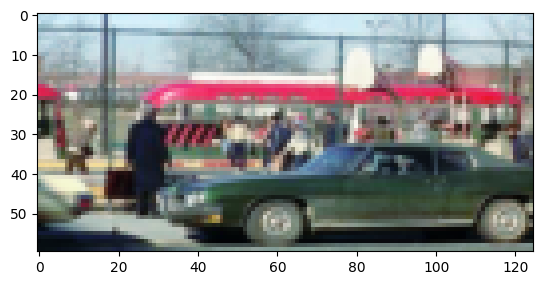

In [10]:
# @title Testing some of the outputs of the SP dataset
frames, descriptions, image_target, text_target = sp_train_dataset[np.random.randint(0,400)]

print("Description: ", descriptions.shape)
figure, ax = plt.subplots(1,1)
show_image(ax, image_target)

# Do some tests on the batches (try with batch size small)
frames, descriptions, image_target, text_target = next(iter(train_dataloader))
print(frames.shape)
print(descriptions.shape)

I will leave the test of the other datasets to you.

# **Chapter 2: Models**


---



We provide a simple text encoder based on a recurrent neural network (LSTM). Feel free to provide your own text encoder.

## 2.1 The NLP models

In [ ]:
# # @title The text autoencoder (Seq2Seq)

# class EncoderLSTM(nn.Module):
#     """
#       Encodes a sequence of tokens into a latent space representation.
#     """
#     def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers=1, dropout=0.1):
#         super().__init__()
#         self.vocab_size = vocab_size
#         self.embedding_dim = embedding_dim
#         self.hidden_dim = hidden_dim
#         self.num_layers = num_layers

#         self.embedding = nn.Embedding(vocab_size, embedding_dim)
#         self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers,
#                             batch_first=True, dropout=dropout if num_layers > 1 else 0)

#     def forward(self, input_seq):
#         embedded = self.embedding(input_seq)
#         outputs, (hidden, cell) = self.lstm(embedded)
#         return outputs, hidden, cell

# class DecoderLSTM(nn.Module):
#     """
#       Decodes a latent space representation into a sequence of tokens.
#     """
#     def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers=1, dropout=0.1):
#         super().__init__()
#         self.vocab_size = vocab_size
#         self.embedding_dim = embedding_dim
#         self.hidden_dim = hidden_dim
#         self.num_layers = num_layers

#         self.embedding = nn.Embedding(vocab_size, embedding_dim)
#         self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers,
#                             batch_first=True, dropout=dropout if num_layers > 1 else 0)
#         self.out = nn.Linear(hidden_dim, vocab_size) # Should be hidden_dim

#     def forward(self, input_seq, hidden, cell):
#         embedded = self.embedding(input_seq)
#         output, (hidden, cell) = self.lstm(embedded, (hidden, cell))
#         prediction = self.out(output)
#         return prediction, hidden, cell

# # We create the basic text autoencoder (a special case of a sequence to sequence model)
# class Seq2SeqLSTM(nn.Module):
#     def __init__(self, encoder, decoder):
#         super().__init__()
#         self.encoder = encoder
#         self.decoder = decoder

#     def forward(self, input_seq, target_seq):
#         # input_seq and target_seq are both your 'input_ids'
#         # 1. Encode the input sequence
#         _enc_out, hidden, cell = self.encoder(input_seq)

#         # 2. Create the "shifted" decoder input for teacher forcing.
#         # We want to predict target_seq[:, 1:]
#         # So, we feed in target_seq[:, :-1]
#         # (i.e., feed "[SOS], hello, world" to predict "hello, world, [EOS]")
#         decoder_input = target_seq[:, :-1]

#         # 3. Run the decoder *once* on the entire sequence.
#         # It takes the encoder's final state (hidden, cell)
#         # and the full "teacher" sequence (decoder_input).
#         predictions, _hidden, _cell = self.decoder(decoder_input, hidden, cell)

#         # predictions shape will be (batch_size, seq_len-1, vocab_size)
#         return predictions


In [11]:
# @title Transformer-Based Text Encoder (NEW)

class TransformerTextEncoder(nn.Module):
    """
    Transformer-based text encoder - replaces LSTM encoder
    Uses self-attention to capture long-range dependencies better
    """
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_heads=4, num_layers=2, dropout=0.1):
        super().__init__()
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.hidden_dim = hidden_dim

        # Token embedding
        self.embedding = nn.Embedding(vocab_size, embedding_dim)

        # Positional encoding (learnable)
        self.pos_embedding = nn.Parameter(torch.randn(1, 512, embedding_dim))

        # Transformer encoder layers
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embedding_dim,
            nhead=num_heads,
            dim_feedforward=hidden_dim * 2,
            dropout=dropout,
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Project to desired hidden dimension
        self.projection = nn.Linear(embedding_dim, hidden_dim)

    def forward(self, input_seq):
        """
        Args:
            input_seq: (batch_size, seq_len)
        Returns:
            encoded: (batch_size, seq_len, hidden_dim)
            pooled: (batch_size, hidden_dim) - for compatibility
        """
        batch_size, seq_len = input_seq.shape

        # Embed tokens
        embedded = self.embedding(input_seq)  # (B, L, E)

        # Add positional encoding
        embedded = embedded + self.pos_embedding[:, :seq_len, :]

        # Apply transformer
        encoded = self.transformer(embedded)  # (B, L, E)

        # Project to hidden_dim
        encoded = self.projection(encoded)  # (B, L, H)

        # Pool for compatibility (mean pooling)
        pooled = encoded.mean(dim=1)  # (B, H)

        return encoded, pooled

In [12]:
class SharpCrossModal(nn.Module):
    def __init__(self, text_encoder):
        super().__init__()
        self.text_encoder = text_encoder

        # SHARPER ENCODER - Keep more details
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2),  # 30x62

            nn.Conv2d(32, 64, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2),  # 15x31

            nn.Conv2d(64, 128, 3, padding=1),
            nn.LeakyReLU(0.2),
            # NO adaptive pooling - keep spatial info!
        )

        # Text projection
        self.text_proj = nn.Linear(256, 128)

        # Attention
        self.attention = nn.MultiheadAttention(128, 8, batch_first=True)

        # SHARPER DECODER with skip connections
        self.decoder = nn.Sequential(
            # Upsample path
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),  # 30x62
            nn.Conv2d(128, 64, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 64, 3, padding=1),
            nn.LeakyReLU(0.2),

            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),  # 60x124
            nn.Conv2d(64, 32, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.LeakyReLU(0.2),

            # Final sharpening layer
            nn.Conv2d(32, 16, 3, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(16, 3, 3, padding=1),
            nn.Tanh()
        )

    def forward(self, frames, text_inputs):
        batch_size = frames.size(0)

        # Use frame 4 only (simplest approach)
        frame4 = frames[:, -1, :, :, :]
        text4 = text_inputs[:, -1, :]

        # Encode image
        img_features = self.encoder(frame4)  # [batch, 128, 15, 31]

        # Encode text
        text_encoded, _ = self.text_encoder(text4)
        text_features = self.text_proj(text_encoded.mean(dim=1))  # [batch, 128]

        # Flatten spatial features
        spatial_tokens = img_features.flatten(2).permute(0, 2, 1)  # [batch, 15*31, 128]
        text_tokens = text_features.unsqueeze(1)  # [batch, 1, 128]

        # Attention
        attended, _ = self.attention(spatial_tokens, text_tokens, text_tokens)

        # Reshape back
        attended = attended.permute(0, 2, 1).view(batch_size, 128, 15, 31)

        # Decode
        predicted = self.decoder(attended)
        predicted = predicted[:, :, :60, :125]  # Crop to exact size

        return predicted

In [13]:
# @title Utility functions for NLP tasks
def generate(model, hidden, cell, max_len, sos_token_id, eos_token_id):
      """
        This function generates a sequence of tokens using the provided decoder.
      """
      # Ensure the model is in evaluation mode
      model.eval()

      # 2. SETUP DECODER INPUT
      # Start with the SOS token, shape (1, 1)
      dec_input = torch.tensor([[sos_token_id]], dtype=torch.long, device=device)
      # hidden = torch.zeros(1, 1, hidden_dim, device=device)
      # cell = torch.zeros(1, 1, hidden_dim, device=device)

      generated_tokens = []

      # 3. AUTOREGRESSIVE LOOP
      for _ in range(max_len):
          with torch.no_grad():
              # Run the decoder one step at a time
              # dec_input is (1, 1) here—it's just the last predicted token
              prediction, hidden, cell = model(dec_input, hidden, cell)

          logits = prediction.squeeze(1) # Shape (1, vocab_size)
          temperature = 0.9 # <--- Try a value between 0.5 and 1.0

          # 1. Divide logits by temperature
          # 2. Apply softmax to get probabilities
          # 3. Use multinomial to sample one token based on the probabilities
          probabilities = torch.softmax(logits / temperature, dim=-1)
          next_token = torch.multinomial(probabilities, num_samples=1)

          token_id = next_token.squeeze().item()

          # Check for the End-of-Sequence token
          if token_id == eos_token_id:
              break

          if token_id == 0 or token_id == sos_token_id:
              continue

            # Append the predicted token
          generated_tokens.append(token_id)

          # The predicted token becomes the input for the next iteration
          dec_input = next_token

      # Return the list of generated token IDs
      return generated_tokens


In [ ]:
# @title Do some tests
# desc = text_dataset[np.random.randint(0, 100)]
# print(f"Input: {desc}")
# input_ids = tokenizer(desc, return_tensors="pt",  padding=True, truncation=True).input_ids
# input_ids = input_ids.to(device)
# generated_tokens = generate(model, hidden, cell, max_len=100, sos_token_id=tokenizer.cls_token_id, eos_token_id=tokenizer.sep_token_id)
# print("Output: ", tokenizer.decode(generated_tokens))

## 2.2 The Vision models

In [ ]:
# # @title The visual autoencoder
# class Backbone(nn.Module):
#     """
#       Main convolutional blocks for our CNN
#     """
#     def __init__(self, latent_dim=16, output_w = 8, output_h = 16):
#         super(Backbone, self).__init__()
#         # Encoder convolutional layers
#         self.encoder_conv = nn.Sequential(
#             nn.Conv2d(3, 16, 7, stride=2, padding=3),
#             nn.GroupNorm(8, 16),
#             nn.LeakyReLU(0.1),

#             nn.Conv2d(16, 32, 5, stride=2, padding=2),
#             nn.GroupNorm(8, 32),
#             nn.LeakyReLU(0.1),

#             nn.Conv2d(32, 64, 3, stride=2, padding=1),
#             nn.GroupNorm(8, 64),
#             nn.LeakyReLU(0.1),
#         )

#         # Calculate flattened dimension for linear layer
#         self.flatten_dim = 64 * output_w * output_h
#         # Latent space layers
#         self.fc1 = nn.Sequential(nn.Linear(self.flatten_dim, latent_dim), nn.ReLU())


#     def forward(self, x):
#         x = self.encoder_conv(x)
#         x = x.view(-1, self.flatten_dim)  # flatten for linear layer
#         z = self.fc1(x)
#         return z

# class VisualEncoder(nn.Module):
#     """
#       Encodes an image into a latent space representation. Note the two pathways
#       to try to disentangle the mean pattern from the image
#     """
#     def __init__(self, latent_dim=16, output_w = 8, output_h = 16):
#         super(VisualEncoder, self).__init__()

#         self.context_backbone = Backbone(latent_dim, output_w, output_h)
#         self.content_backbone = Backbone(latent_dim, output_w, output_h)

#         self.projection = nn.Linear(2*latent_dim, latent_dim)
#     def forward(self, x):
#         z_context = self.context_backbone(x)
#         z_content = self.content_backbone(x)
#         z = torch.cat((z_content, z_context), dim=1)
#         z = self.projection(z)
#         return z

# class VisualDecoder(nn.Module):
#     """
#       Decodes a latent representation into a content image and a context image
#     """
#     def __init__(self, latent_dim=16, output_w = 8, output_h = 16):
#         super(VisualDecoder, self).__init__()
#         self.imh = 60
#         self.imw = 125
#         self.flatten_dim = 64 * output_w * output_h
#         self.output_w = output_w
#         self.output_h = output_h

#         self.fc1 = nn.Linear(latent_dim, self.flatten_dim)

#         self.decoder_conv = nn.Sequential(
#           nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=(1,1)),
#           nn.GroupNorm(8, 32),
#           nn.LeakyReLU(0.1),

#           nn.ConvTranspose2d(32, 16, kernel_size=5, stride=2, padding=2, output_padding=1),
#           nn.GroupNorm(8, 16),
#           nn.LeakyReLU(0.1),

#           nn.ConvTranspose2d(16, 3, kernel_size=7, stride=2, padding=3, output_padding=(1, 1)),
#           nn.Sigmoid() # Use nn.Tanh() if your data is normalized to [-1, 1]
#       )

#     def forward(self, z):
#       x = self.fc1(z)

#       x_content = self.decode_image(x)
#       x_context = self.decode_image(x)

#       return x_content, x_context

#     def decode_image(self, x):
#       x = x.view(-1, 64, self.output_w, self.output_h)      # reshape to conv feature map
#       x = self.decoder_conv(x)
#       x = x[:, :, :self.imh, :self.imw]          # crop to original size if needed
#       return x

# class VisualAutoencoder( nn.Module):
#     def __init__(self, latent_dim=16, output_w = 8, output_h = 16):
#         super(VisualAutoencoder, self).__init__()
#         self.encoder = VisualEncoder(latent_dim, output_w, output_h)
#         self.decoder = VisualDecoder(latent_dim, output_w, output_h)

#     def forward(self, x):
#         z = self.encoder(x)
#         x_hat = self.decoder(z)
#         return x_hat



## 2.3 The main architecture


In [ ]:
# # @title A simple attention architecture

# class Attention(nn.Module):
#     def __init__(self, hidden_dim):
#         super(Attention, self).__init__()
#         # This "attention" layer learns a query vector
#         self.attn = nn.Linear(hidden_dim, 1)
#         self.softmax = nn.Softmax(dim=1) # Over the sequence length

#     def forward(self, rnn_outputs):
#         # rnn_outputs shape: [batch, seq_len, hidden_dim]

#         # Pass through linear layer to get "energy" scores
#         energy = self.attn(rnn_outputs).squeeze(2) # Shape: [batch, seq_len]

#         # Get attention weights
#         attn_weights = self.softmax(energy) # Shape: [batch, seq_len]

#         # Apply weights
#         # attn_weights.unsqueeze(1) -> [batch, 1, seq_len]
#         # bmm with rnn_outputs -> [batch, 1, hidden_dim]
#         context = torch.bmm(attn_weights.unsqueeze(1), rnn_outputs)

#         # Squeeze to get final context vector
#         return context.squeeze(1) # Shape: [batch, hidden_dim]

In [ ]:
# # @title Cross-Modal Attention Mechanism (NEW)

# class CrossModalAttention(nn.Module):
#     """
#     Cross-modal attention: allows one modality (query) to attend to another (key/value)
#     This enables better fusion between visual and textual features
#     """
#     def __init__(self, query_dim, key_dim, hidden_dim, num_heads=4):
#         super().__init__()
#         self.num_heads = num_heads
#         self.hidden_dim = hidden_dim
#         self.head_dim = hidden_dim // num_heads

#         assert hidden_dim % num_heads == 0, "hidden_dim must be divisible by num_heads"

#         # Linear projections for Q, K, V
#         self.query_proj = nn.Linear(query_dim, hidden_dim)
#         self.key_proj = nn.Linear(key_dim, hidden_dim)
#         self.value_proj = nn.Linear(key_dim, hidden_dim)

#         # Output projection
#         self.out_proj = nn.Linear(hidden_dim, hidden_dim)

#         self.dropout = nn.Dropout(0.1)

#     def forward(self, query, key_value):
#         """
#         Args:
#             query: (batch, query_len, query_dim) - e.g., visual features
#             key_value: (batch, kv_len, key_dim) - e.g., text features
#         Returns:
#             output: (batch, query_len, hidden_dim)
#             attention_weights: (batch, num_heads, query_len, kv_len)
#         """
#         batch_size = query.shape[0]

#         # Linear projections
#         Q = self.query_proj(query)  # (B, QL, H)
#         K = self.key_proj(key_value)  # (B, KL, H)
#         V = self.value_proj(key_value)  # (B, KL, H)

#         # Reshape for multi-head attention
#         # (B, L, H) -> (B, L, num_heads, head_dim) -> (B, num_heads, L, head_dim)
#         Q = Q.view(batch_size, -1, self.num_heads, self.head_dim).transpose(1, 2)
#         K = K.view(batch_size, -1, self.num_heads, self.head_dim).transpose(1, 2)
#         V = V.view(batch_size, -1, self.num_heads, self.head_dim).transpose(1, 2)

#         # Scaled dot-product attention
#         scores = torch.matmul(Q, K.transpose(-2, -1)) / (self.head_dim ** 0.5)
#         attention_weights = torch.softmax(scores, dim=-1)
#         attention_weights = self.dropout(attention_weights)

#         # Apply attention to values
#         attended = torch.matmul(attention_weights, V)  # (B, num_heads, QL, head_dim)

#         # Reshape back
#         attended = attended.transpose(1, 2).contiguous()  # (B, QL, num_heads, head_dim)
#         attended = attended.view(batch_size, -1, self.hidden_dim)  # (B, QL, H)

#         # Output projection
#         output = self.out_proj(attended)

#         return output, attention_weights


# class BiDirectionalCrossModalFusion(nn.Module):
#     """
#     Bi-directional cross-modal fusion:
#     - Text attends to Visual
#     - Visual attends to Text
#     Then combines both
#     """
#     def __init__(self, visual_dim, text_dim, hidden_dim, num_heads=4):
#         super().__init__()

#         # Text -> Visual attention
#         self.text_to_visual = CrossModalAttention(text_dim, visual_dim, hidden_dim, num_heads)

#         # Visual -> Text attention
#         self.visual_to_text = CrossModalAttention(visual_dim, text_dim, hidden_dim, num_heads)

#         # Fusion layer
#         self.fusion = nn.Sequential(
#             nn.Linear(hidden_dim * 2, hidden_dim),
#             nn.LayerNorm(hidden_dim),
#             nn.ReLU(),
#             nn.Dropout(0.1)
#         )

#     def forward(self, visual_features, text_features):
#         """
#         Args:
#             visual_features: (batch, seq_len, visual_dim)
#             text_features: (batch, seq_len, text_dim)
#         Returns:
#             fused: (batch, seq_len, hidden_dim)
#         """
#         # Cross-modal attention in both directions
#         text_attended, _ = self.text_to_visual(text_features, visual_features)
#         visual_attended, _ = self.visual_to_text(visual_features, text_features)

#         # Concatenate and fuse
#         combined = torch.cat([text_attended, visual_attended], dim=-1)
#         fused = self.fusion(combined)

#         return fused

In [ ]:
# # @title The main sequence predictor model

# class SequencePredictor(nn.Module):
#     def __init__(self, visual_autoencoder, text_autoencoder, latent_dim,
#                  gru_hidden_dim):
#         super(SequencePredictor, self).__init__()

#         # --- 1. Static Encoders ---
#         # (These process one pair at a time)
#         self.image_encoder = visual_autoencoder.encoder
#         self.text_encoder = text_autoencoder.encoder

#         # --- 2. Temporal Encoder ---
#         # (This processes the sequence of pairs)
#         fusion_dim = latent_dim * 2 # z_visual + z_text
#         self.temporal_rnn = nn.GRU(fusion_dim, latent_dim, batch_first=True)

#         # --- 3. Attention ---
#         self.attention = Attention(gru_hidden_dim)

#         # --- 4. Final Projection ---
#         # cat(h, context) -> gru_hidden_dim * 2
#         self.projection = nn.Sequential(
#             nn.Linear(gru_hidden_dim * 2, latent_dim),
#             nn.ReLU()
#         )

#         # --- 5. Decoders ---
#         # (These predict the *next* item)
#         self.image_decoder = visual_autoencoder.decoder
#         self.text_decoder = text_autoencoder.decoder

#         self.fused_to_h0 = nn.Linear(latent_dim, 16)
#         self.fused_to_c0 = nn.Linear(latent_dim, 16)

#     def forward(self, image_seq, text_seq, target_seq):
#         # image_seq shape: [batch, seq_len, C, H, W]
#         # text_seq shape:  [batch, seq_len, text_len]
#         # target_text_for_teacher_forcing: [batch, text_len] (This is the last text)

#         batch_size, seq_len, C, H, W = image_seq.shape

#         # --- 1 & 2: Run Static Encoders over the sequence ---
#         # We can't pass a 5D/4D tensor to the encoders.
#         # We "flatten" the batch and sequence dimensions.

#         # Reshape for image_encoder
#         img_flat = image_seq.view(batch_size * seq_len, C, H, W)
#         # Reshape for text_encoder
#         txt_flat = text_seq.view(batch_size * seq_len, -1) # -1 infers text_len

#         # Run encoders
#         z_v_flat = self.image_encoder(img_flat) # Shape: [b*s, latent]
#         _, hidden, cell = self.text_encoder(txt_flat) # Shape: [b*s, latent]

#         # Combine
#         z_fusion_flat = torch.cat((z_v_flat, hidden.squeeze(0)), dim=1) # Shape: [b*s, fusion_dim]

#         # "Un-flatten" back into a sequence
#         z_fusion_seq = z_fusion_flat.view(batch_size, seq_len, -1) # Shape: [b, s, fusion_dim]

#         # --- 3. Run Temporal Encoder ---
#         # zseq shape: [b, s, gru_hidden]
#         # h    shape: [1, b, gru_hidden]
#         zseq, h = self.temporal_rnn(z_fusion_seq)
#         h = h.squeeze(0) # Shape: [b, gru_hidden]

#         # --- 4. Attention ---
#         context = self.attention(zseq) # Shape: [b, gru_hidden]

#         # --- 5. Final Prediction Vector (z) ---
#         z = self.projection(torch.cat((h, context), dim=1)) # Shape: [b, joint_latent_dim]

#         # --- 6. Decode (Predict pk) ---
#         pred_image_content, pred_image_context = self.image_decoder(z)

#         h0 = self.fused_to_h0(z).unsqueeze(0)
#         c0 = self.fused_to_c0(z).unsqueeze(0)

#         decoder_input = target_seq[:, :,:-1].squeeze(1)

#         # 3. Run the decoder *once* on the entire sequence.
#         # It takes the encoder's final state (hidden, cell)
#         # and the full "teacher" sequence (decoder_input).
#         predicted_text_logits_k, _hidden, _cell = self.text_decoder(decoder_input, h0, c0)

#         return pred_image_content, pred_image_context, predicted_text_logits_k,h0, c0

# **Chapter 3: Training routines**


---




In [14]:
# @title Validation function
def validation(model, data_loader, tokenizer):
    """Validation function with text under each image (adapted from your version)"""
    model.eval()
    with torch.no_grad():
        frames, descriptions, image_target, text_target = next(iter(data_loader))

        # Move to device
        frames = frames.to(device)
        descriptions = descriptions.to(device)
        image_target = image_target.to(device)
        text_target = text_target.to(device)

        # Get prediction from transformer model
        predicted_image = model(frames, descriptions)

        # Ensure correct size
        if predicted_image.shape[-2:] != (60, 125):
            predicted_image = F.interpolate(predicted_image, size=(60, 125),
                                           mode='bilinear', align_corners=False)

        # Create figure with 2 rows (images + text)
        figure, ax = plt.subplots(2, 6, figsize=(20, 8),
                                 gridspec_kw={'height_ratios': [3, 1]})

        # Show input frames 1-4 with their text
        for i in range(4):
            # Show image
            img = frames[0, i, :, :, :].cpu()
            show_image(ax[0, i], img)
            ax[0, i].set_title(f'Frame {i+1}', fontsize=11)
            ax[0, i].axis('off')

            # Show corresponding text
            wrapped_text = textwrap.fill(
                tokenizer.decode(descriptions[0, i, :], skip_special_tokens=True),
                width=30
            )
            ax[1, i].text(
                0.5, 0.5,
                wrapped_text,
                ha='center',
                va='center',
                fontsize=9,
                wrap=True
            )
            ax[1, i].axis('off')

        # Column 4: Ground truth frame 5
        show_image(ax[0, 4], image_target[0].cpu())
        ax[0, 4].set_title('Ground Truth Frame 5', fontsize=11, color='green')
        ax[0, 4].axis('off')

        # Text for ground truth
        wrapped_text = textwrap.fill(
            tokenizer.decode(text_target[0].squeeze(), skip_special_tokens=True),
            width=30
        )
        ax[1, 4].text(
            0.5, 0.5,
            wrapped_text,
            ha='center',
            va='center',
            fontsize=9,
            wrap=True
        )
        ax[1, 4].axis('off')

        # Column 5: Predicted frame 5
        show_image(ax[0, 5], predicted_image[0].cpu())
        ax[0, 5].set_title('Predicted Frame 5', fontsize=11, color='blue')
        ax[0, 5].axis('off')

        # Text for prediction (show text from frame 4 since that's what model uses)
        frame4_text = tokenizer.decode(descriptions[0, 3, :], skip_special_tokens=True)
        wrapped_text = textwrap.fill(
            f"Based on Frame 4: {frame4_text[:50]}...",
            width=30
        )
        ax[1, 5].text(
            0.5, 0.5,
            wrapped_text,
            ha='center',
            va='center',
            fontsize=9,
            wrap=True
        )
        ax[1, 5].axis('off')

        plt.suptitle('Frame Predictions with Text Descriptions', fontsize=14, y=1.02)
        plt.tight_layout()
        plt.show()

    model.train()

In [ ]:
# # @title Training utility functions: To initialize and to visualize the progress


# def init_weights(m):
#     if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
#         nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
#         if m.bias is not None:
#             nn.init.zeros_(m.bias)
#     elif isinstance(m, nn.Linear):
#         nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
#         nn.init.constant_(m.bias, 0)


# # Plots four images and their reconstructions
# def validation( model, data_loader ):
#   model.eval()
#   with torch.no_grad():
#     frames, descriptions, image_target, text_target = next(iter(data_loader))

#     descriptions = descriptions.to(device)
#     frames = frames.to(device)
#     image_target = image_target.to(device)
#     text_target = text_target.to(device)

#     predicted_image_k,context_image, _, hidden, cell = model(frames, descriptions, text_target)

#     figure, ax = plt.subplots(2, 6, figsize=(20, 5), gridspec_kw={'height_ratios': [2, 1.5]})

#     for i in range(4):
#       im = frames[0, i, :, :, :].cpu()
#       show_image(ax[0,i], im )
#       ax[0,i].set_aspect('auto')
#       ax[0,i].axis('off')
#       wrapped_text = textwrap.fill(tokenizer.decode(descriptions[0, i, :], skip_special_tokens=True), width=40)

#       ax[1,i].text(
#             0.5, 0.99,
#             wrapped_text,
#             ha='center',
#             va='top',
#             fontsize=10,
#             wrap=True
#         )

#       ax[1,i].axis('off') # Hide axes for the text subplot

#     show_image(ax[0,4], image_target[0].cpu())
#     ax[0,4].set_title('Target')
#     ax[0,4].set_aspect('auto')
#     ax[0,4].axis('off')
#     text_target = text_target.squeeze(1)

#     wrapped_text = textwrap.fill(tokenizer.decode(text_target[0], skip_special_tokens=True), width=40)
#     ax[1,4].text(
#             0.5, 0.99,
#             wrapped_text,
#             ha='center',
#             va='top',
#             fontsize=10,
#             wrap=False)
#     ax[1,4].axis('off')
#     output = context_image[0, :, :, :].cpu()
#     show_image(ax[0,5], output)
#     ax[0,5].set_title('Predicted')
#     ax[0,5].set_aspect('auto')
#     ax[0,5].axis('off')

#     generated_tokens = generate(model.text_decoder,
#                                 hidden[:,0, :].unsqueeze(1),
#                                 cell[:, 0, :].unsqueeze(1),
#                                 max_len=150,
#                                 sos_token_id=tokenizer.cls_token_id,
#                                 eos_token_id=tokenizer.sep_token_id)

#     wrapped_text = textwrap.fill(tokenizer.decode(generated_tokens), width=40)

#     ax[1,5].text(
#             0.5, 0.99,
#             wrapped_text,
#             ha='center',
#             va='top',
#             fontsize=10,
#             wrap=False )
#     ax[1,5].axis('off')
#     plt.tight_layout()
#     plt.show()


## 3.1 Initialization and setup

In [15]:
# @title Simple Setup for Cross-Modal Transformer (NEW)
torch.cuda.empty_cache()
gc.collect()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters
N_EPOCHS = 10  # More epochs for transformers
learning_rate = 1e-4

print(f"Using device: {device}")

Using device: cpu


In [ ]:
# # @title Variables and initial setup
# torch.cuda.empty_cache()
# gc.collect()
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# N_EPOCHS = 5
# emb_dim = 16
# latent_dim = 16
# num_layers = 1
# dropout = True

In [ ]:
# # @title Initializing the NLP models
# encoder = EncoderLSTM(tokenizer.vocab_size, emb_dim, latent_dim, num_layers, dropout).to(device)
# decoder = DecoderLSTM(tokenizer.vocab_size, emb_dim, latent_dim, num_layers, dropout).to(device)
# text_autoencoder = Seq2SeqLSTM(encoder, decoder).to(device)
# text_autoencoder, _, _, _ = load_checkpoint_from_drive(text_autoencoder, None, filename='text_autoencoder.pth')

# total_params = sum(p.numel() for p in text_autoencoder.parameters())
# print(f"Total parameters (Not trainable): {total_params}")
# # Deactivating training from this model for efficiency (although not ideal)
# for param in text_autoencoder.parameters():
#         param.requires_grad = False


Checkpoint loaded from: /content/gdrive/MyDrive/DL_Checkpoints/text_autoencoder.pth (epoch 15)
Total parameters (Not trainable): 1499930


In [ ]:
# # @title Initializing visual models
# visual_autoencoder = VisualAutoencoder(latent_dim=16)
# visual_autoencoder.apply(init_weights)

# total_params = sum(p.numel() for p in visual_autoencoder.parameters() if p.requires_grad)
# print(f"Total trainable parameters in visual autoencoder: {total_params}")

Total trainable parameters in visual autoencoder: 503539


In [ ]:
# # @title Initialize the main architecture
# # We put all the sizes the same, not ideal as well
# sequence_predictor = SequencePredictor(visual_autoencoder, text_autoencoder, latent_dim, latent_dim)
# sequence_predictor.to(device)

# # # Print number of trainable parameters
# total_params = sum(p.numel() for p in sequence_predictor.parameters() if p.requires_grad)
# print(f"Total trainable parameters in the whole model: {total_params}")

# # Print model size
# total_params = sum(p.numel() for p in sequence_predictor.parameters())
# print(f"Total parameters: {total_params}")

Total trainable parameters in the whole model: 507028
Total parameters: 2006958


In [ ]:
# # @title Add Perceptual Loss

# import torch
# import torch.nn as nn
# import torchvision.models as models

# class LightweightPerceptualLoss(nn.Module):
#     def __init__(self):
#         super().__init__()
#         vgg = models.vgg16(pretrained=True)
#         self.features = nn.Sequential(*list(vgg.features[:9])).eval()
#         for param in self.features.parameters():
#             param.requires_grad = False
#         self.criterion = nn.MSELoss()

#     def forward(self, pred, target):
#         pred_normalized = (pred - 0.5) / 0.5
#         target_normalized = (target - 0.5) / 0.5
#         pred_features = self.features(pred_normalized)
#         target_features = self.features(target_normalized)
#         return self.criterion(pred_features, target_features)

# # Initialize it
# perceptual_loss = LightweightPerceptualLoss()

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:10<00:00, 54.0MB/s]


## 3.2 Training loops

In [16]:
def show_all_frames_with_text(model, dataloader, device, tokenizer, num_examples=2):
    """Show frames 1-4, predicted 5, ground truth 5 WITH TEXT DESCRIPTIONS"""
    model.eval()
    with torch.no_grad():
        frames, descriptions, target, text_target = next(iter(dataloader))

        frames = frames[:num_examples].to(device)
        descriptions = descriptions[:num_examples].to(device)
        target = target[:num_examples].to(device)

        predicted = model(frames, descriptions)

        def denorm(img):
            return (img + 1) / 2

        # Create figure with text below
        fig = plt.figure(figsize=(15, 3*num_examples + 1))

        # Create gridspec: images on top, text below
        gs = fig.add_gridspec(num_examples + 1, 6, height_ratios=[3]*num_examples + [1])

        for i in range(num_examples):
            # Show input frames 1-4
            for j in range(4):
                ax = fig.add_subplot(gs[i, j])
                img = denorm(frames[i, j]).permute(1, 2, 0).cpu()
                ax.imshow(img)
                ax.set_title(f"Frame {j+1}", fontsize=10)
                ax.axis('off')

            # Show predicted frame 5
            ax = fig.add_subplot(gs[i, 4])
            pred_img = denorm(predicted[i]).permute(1, 2, 0).cpu()
            ax.imshow(pred_img)
            ax.set_title("Predicted 5", fontsize=10, color='blue')
            ax.axis('off')

            # Show ground truth frame 5
            ax = fig.add_subplot(gs[i, 5])
            gt_img = denorm(target[i]).permute(1, 2, 0).cpu()
            ax.imshow(gt_img)
            ax.set_title("Truth 5", fontsize=10, color='green')
            ax.axis('off')

        # Add text descriptions at the bottom
        text_ax = fig.add_subplot(gs[num_examples, :])
        text_ax.axis('off')

        # Decode text from token IDs
        text_lines = []
        for i in range(num_examples):
            for j in range(4):
                # Get text tokens for this frame
                text_tokens = descriptions[i, j]
                # Remove padding tokens (0)
                text_tokens = text_tokens[text_tokens != 0]
                # Decode
                text = tokenizer.decode(text_tokens, skip_special_tokens=True)
                text_lines.append(f"Sample {i+1}, Frame {j+1}: {text[:100]}...")

        text_ax.text(0, 0.5, "\n".join(text_lines),
                    fontsize=9, va='center', wrap=True)

        plt.suptitle("Frame Predictions with Text Descriptions", fontsize=14, y=0.98)
        plt.tight_layout()
        plt.show()

Epoch 0, Batch 0, Loss: 0.5683
Epoch 0, Batch 10, Loss: 0.4493
Epoch 0, Batch 20, Loss: 0.2705
Epoch 0, Batch 30, Loss: 0.2548
Epoch 0, Batch 40, Loss: 0.2620
Epoch 0, Batch 50, Loss: 0.2499
Epoch 0, Batch 60, Loss: 0.2569
Epoch 0, Batch 70, Loss: 0.2500
Epoch 0, Batch 80, Loss: 0.2568
Epoch 0, Batch 90, Loss: 0.2459
Epoch 0, Batch 100, Loss: 0.2460
Epoch 0, Batch 110, Loss: 0.2455
Epoch 0, Batch 120, Loss: 0.2412
Epoch 0, Batch 130, Loss: 0.2405
Epoch 0, Batch 140, Loss: 0.2519
Epoch 0, Batch 150, Loss: 0.2481
Epoch 0, Batch 160, Loss: 0.2454
Epoch 0, Batch 170, Loss: 0.2423
Epoch 0, Batch 180, Loss: 0.2449
Epoch 0, Batch 190, Loss: 0.2404
Epoch 0, Batch 200, Loss: 0.2541
Epoch 0, Batch 210, Loss: 0.2419
Epoch 0, Batch 220, Loss: 0.2419
Epoch 0, Batch 230, Loss: 0.2461
Epoch 0, Batch 240, Loss: 0.2415
Epoch 0, Batch 250, Loss: 0.2426
Epoch 0, Batch 260, Loss: 0.2535
Epoch 0, Batch 270, Loss: 0.2443
Epoch 0, Batch 280, Loss: 0.2418
Epoch 0, Batch 290, Loss: 0.2491
Epoch 0, Batch 300, L

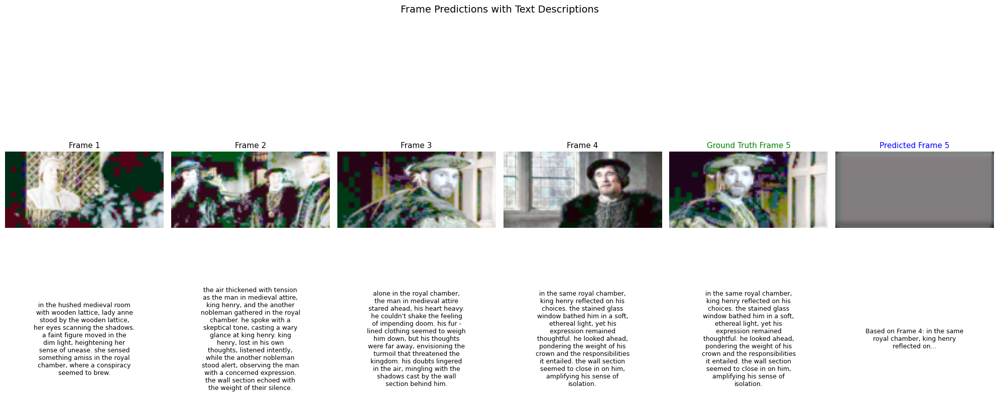

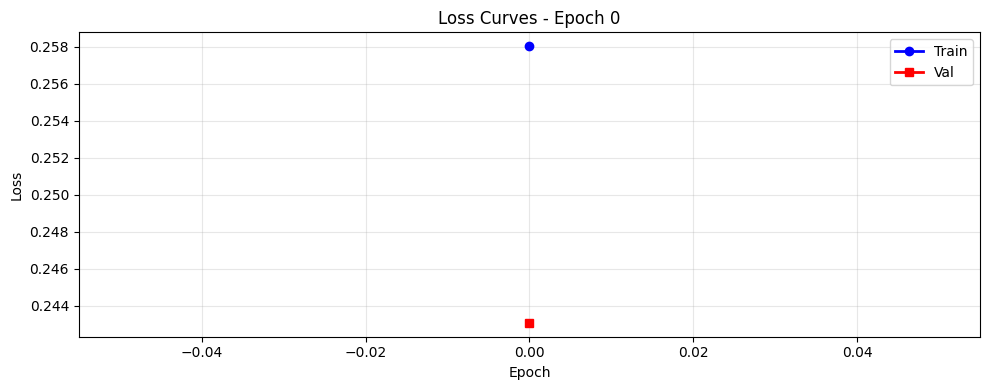

Epoch 1, Batch 0, Loss: 0.2421
Epoch 1, Batch 10, Loss: 0.2452
Epoch 1, Batch 20, Loss: 0.2426
Epoch 1, Batch 30, Loss: 0.2398
Epoch 1, Batch 40, Loss: 0.2362
Epoch 1, Batch 50, Loss: 0.2384
Epoch 1, Batch 60, Loss: 0.2374
Epoch 1, Batch 70, Loss: 0.2385
Epoch 1, Batch 80, Loss: 0.2601
Epoch 1, Batch 90, Loss: 0.2402
Epoch 1, Batch 100, Loss: 0.2446
Epoch 1, Batch 110, Loss: 0.2418
Epoch 1, Batch 120, Loss: 0.2409
Epoch 1, Batch 130, Loss: 0.2392
Epoch 1, Batch 140, Loss: 0.2487
Epoch 1, Batch 150, Loss: 0.2398
Epoch 1, Batch 160, Loss: 0.2397
Epoch 1, Batch 170, Loss: 0.2358
Epoch 1, Batch 180, Loss: 0.2508
Epoch 1, Batch 190, Loss: 0.2402
Epoch 1, Batch 200, Loss: 0.2406
Epoch 1, Batch 210, Loss: 0.2369
Epoch 1, Batch 220, Loss: 0.2528


In [ ]:
# @title Training Loop with Loss Plotting

import matplotlib.pyplot as plt
import numpy as np

# Define text encoder
text_encoder = TransformerTextEncoder(
    vocab_size=tokenizer.vocab_size,
    embedding_dim=256,
    hidden_dim=256,
    num_heads=4,
    num_layers=2
)

# Use the SHARP model
model = SharpCrossModal(text_encoder).to(device)

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

# Simple L1 loss (better for images)
criterion = nn.L1Loss()

# Store losses for plotting
train_losses = []
val_losses = []

# Training - 5 epochs
num_epochs = 5
for epoch in range(num_epochs):
    # === TRAINING ===
    model.train()
    epoch_train_loss = 0
    batch_count = 0

    for batch_idx, (frames, descriptions, image_target, text_target) in enumerate(train_dataloader):
        frames = frames.to(device)
        descriptions = descriptions.to(device)
        image_target = image_target.to(device)

        # Forward
        predicted = model(frames, descriptions)

        # Resize if needed
        if predicted.shape[-2:] != (60, 125):
            predicted = F.interpolate(predicted, size=(60, 125), mode='bilinear', align_corners=False)

        # Calculate loss
        loss = criterion(predicted, image_target)

        # Backward
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        epoch_train_loss += loss.item()
        batch_count += 1

        if batch_idx % 10 == 0:
            print(f'Epoch {epoch}, Batch {batch_idx}, Loss: {loss.item():.4f}')

    avg_train_loss = epoch_train_loss / batch_count
    train_losses.append(avg_train_loss)

    # === VALIDATION ===
    model.eval()
    epoch_val_loss = 0
    val_batch_count = 0

    with torch.no_grad():
        for frames, descriptions, image_target, text_target in val_dataloader:
            frames = frames.to(device)
            descriptions = descriptions.to(device)
            image_target = image_target.to(device)

            predicted = model(frames, descriptions)

            if predicted.shape[-2:] != (60, 125):
                predicted = F.interpolate(predicted, size=(60, 125), mode='bilinear', align_corners=False)

            loss = criterion(predicted, image_target)
            epoch_val_loss += loss.item()
            val_batch_count += 1

    avg_val_loss = epoch_val_loss / val_batch_count
    val_losses.append(avg_val_loss)

    # === EPOCH SUMMARY (NOW OUTSIDE THE BATCH LOOP) ===
    print("\n" + "="*60)
    print(f"EPOCH {epoch} COMPLETED")
    print("="*60)
    print(f"Training Loss: {avg_train_loss:.4f}")
    print(f"Validation Loss: {avg_val_loss:.4f}")

    # Show predictions with text
    validation(model, val_dataloader, tokenizer)

    # Show loss plot
    plt.figure(figsize=(10, 4))
    plt.plot(train_losses, 'b-o', label='Train', linewidth=2)
    plt.plot(val_losses, 'r-s', label='Val', linewidth=2)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Loss Curves - Epoch {epoch}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


# num_epochs = 5
# for epoch in range(num_epochs):
#     # === TRAINING ===
#     model.train()
#     epoch_train_loss = 0
#     batch_count = 0

#     for batch_idx, (frames, descriptions, image_target, text_target) in enumerate(train_dataloader):
#         frames = frames.to(device)
#         descriptions = descriptions.to(device)
#         image_target = image_target.to(device)

#         # Forward
#         predicted = model(frames, descriptions)

#         # Resize if needed
#         if predicted.shape[-2:] != (60, 125):
#             predicted = F.interpolate(predicted, size=(60, 125), mode='bilinear', align_corners=False)

#         # Calculate loss
#         loss = criterion(predicted, image_target)

#         # Backward
#         optimizer.zero_grad()
#         loss.backward()
#         torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
#         optimizer.step()

#         epoch_train_loss += loss.item()
#         batch_count += 1

#         if batch_idx % 10 == 0:
#             print(f'Epoch {epoch}, Batch {batch_idx}, Loss: {loss.item():.4f}')

#     avg_train_loss = epoch_train_loss / batch_count
#     train_losses.append(avg_train_loss)

#     # === VALIDATION ===
#     model.eval()
#     epoch_val_loss = 0
#     val_batch_count = 0

#     with torch.no_grad():
#         for frames, descriptions, image_target, text_target in val_dataloader:
#             frames = frames.to(device)
#             descriptions = descriptions.to(device)
#             image_target = image_target.to(device)

#             predicted = model(frames, descriptions)

#             if predicted.shape[-2:] != (60, 125):
#                 predicted = F.interpolate(predicted, size=(60, 125), mode='bilinear', align_corners=False)

#             loss = criterion(predicted, image_target)
#             epoch_val_loss += loss.item()
#             val_batch_count += 1

#     avg_val_loss = epoch_val_loss / val_batch_count
#     val_losses.append(avg_val_loss)

#     print(f'Epoch {epoch} completed. Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}')

#     # === PLOT LOSSES SO FAR ===
#     plt.figure(figsize=(12, 4))

#     # Plot 1: Loss curves
#     plt.subplot(1, 3, 1)
#     plt.plot(train_losses, 'b-o', label='Training Loss', linewidth=2, markersize=6)
#     plt.plot(val_losses, 'r-s', label='Validation Loss', linewidth=2, markersize=6)
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.title('Loss Curves')
#     plt.legend()
#     plt.grid(True, alpha=0.3)

#     # Plot 2: Loss difference (overfitting indicator)
#     plt.subplot(1, 3, 2)
#     loss_diff = [train - val for train, val in zip(train_losses, val_losses)]
#     plt.bar(range(len(loss_diff)), loss_diff, color='orange', alpha=0.7)
#     plt.axhline(y=0, color='black', linestyle='-', linewidth=1)
#     plt.xlabel('Epoch')
#     plt.ylabel('Train - Val Loss')
#     plt.title('Overfitting Indicator')
#     plt.grid(True, alpha=0.3)

#     # Plot 3: Current predictions
#     plt.subplot(1, 3, 3)
#     with torch.no_grad():
#         val_frames, val_desc, val_target, _ = next(iter(val_dataloader))
#         val_frames = val_frames[:1].to(device)
#         val_desc = val_desc[:1].to(device)
#         val_target = val_target[:1].to(device)

#         val_pred = model(val_frames, val_desc)
#         if val_pred.shape[-2:] != (60, 125):
#             val_pred = F.interpolate(val_pred, size=(60, 125), mode='bilinear', align_corners=False)

#         pred_img = ((val_pred[0] + 1) / 2).permute(1, 2, 0).cpu().numpy()
#         plt.imshow(pred_img)
#         plt.title(f'Epoch {epoch} Prediction')
#         plt.axis('off')

#     plt.suptitle(f'Training Progress - Epoch {epoch}', fontsize=14, y=1.05)
#     plt.tight_layout()
#     plt.show()

#     # === VISUALIZE WITH TEXT ===
#     # In your training cell, replace the visualization section with:

# if epoch % 1 == 0:
#     print("\n" + "="*60)
#     print(f"EPOCH {epoch} - VALIDATION")
#     print("="*60)

#     # Show losses
#     print(f"Training Loss: {avg_train_loss:.4f}")
#     print(f"Validation Loss: {avg_val_loss:.4f}")

#     # Show predictions with text
#     validation(model, val_dataloader, tokenizer)

#     # Also show loss plot
#     plt.figure(figsize=(8, 4))
#     plt.plot(train_losses, 'b-o', label='Train', linewidth=2)
#     plt.plot(val_losses, 'r-s', label='Val', linewidth=2)
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.title(f'Loss Curves - Epoch {epoch}')
#     plt.legend()
#     plt.grid(True, alpha=0.3)
#     plt.tight_layout()
#     plt.show()

# print("\n✅ Training completed!")

# # === FINAL LOSS PLOT ===
# plt.figure(figsize=(15, 5))

# # Final loss curves
# plt.subplot(1, 3, 1)
# epochs = range(len(train_losses))
# plt.plot(epochs, train_losses, 'b-o', label='Training', linewidth=2, markersize=8)
# plt.plot(epochs, val_losses, 'r-s', label='Validation', linewidth=2, markersize=8)
# plt.fill_between(epochs, train_losses, val_losses, alpha=0.2, color='purple')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.title('Final Loss Curves')
# plt.legend()
# plt.grid(True, alpha=0.3)

# # Final predictions comparison
# plt.subplot(1, 3, 2)
# with torch.no_grad():
#     test_frames, test_desc, test_target, _ = next(iter(test_dataloader))
#     test_frames = test_frames[:1].to(device)
#     test_desc = test_desc[:1].to(device)
#     test_target = test_target[:1].to(device)

#     test_pred = model(test_frames, test_desc)
#     if test_pred.shape[-2:] != (60, 125):
#         test_pred = F.interpolate(test_pred, size=(60, 125), mode='bilinear', align_corners=False)

#     pred_img = ((test_pred[0] + 1) / 2).permute(1, 2, 0).cpu().numpy()
#     truth_img = ((test_target[0] + 1) / 2).permute(1, 2, 0).cpu().numpy()

#     # Show side by side
#     combined = np.hstack([pred_img, truth_img])
#     plt.imshow(combined)
#     plt.title('Predicted vs Ground Truth')
#     plt.axis('off')
#     plt.text(60, 70, 'Predicted', color='blue', fontsize=10, ha='center')
#     plt.text(185, 70, 'Truth', color='green', fontsize=10, ha='center')

# # Loss improvement
# plt.subplot(1, 3, 3)
# improvement = [(train_losses[i-1] - train_losses[i])/train_losses[i-1]*100 if i>0 else 0
#                for i in range(len(train_losses))]
# plt.bar(epochs, improvement, color='green', alpha=0.7)
# plt.xlabel('Epoch')
# plt.ylabel('Improvement (%)')
# plt.title('Training Loss Improvement')
# plt.grid(True, alpha=0.3)
# plt.axhline(y=0, color='black', linestyle='-', linewidth=1)

# plt.suptitle(f'Final Results - {num_epochs} Epochs', fontsize=16, y=1.05)
# plt.tight_layout()
# plt.show()

# # Print final stats
# print("\n" + "="*60)
# print("FINAL STATISTICS")
# print("="*60)
# print(f"Starting Train Loss: {train_losses[0]:.4f}")
# print(f"Final Train Loss: {train_losses[-1]:.4f}")
# print(f"Improvement: {((train_losses[0] - train_losses[-1]) / train_losses[0] * 100):.1f}%")
# print(f"Final Validation Loss: {val_losses[-1]:.4f}")
# print(f"Overfitting Gap: {train_losses[-1] - val_losses[-1]:.4f}")
# print("="*60)

# # Final visualization
# print("\n" + "="*60)
# print("FINAL TEST VISUALIZATION")
# print("="*60)
# show_all_frames_with_text(model, test_dataloader, device, tokenizer, num_examples=2)

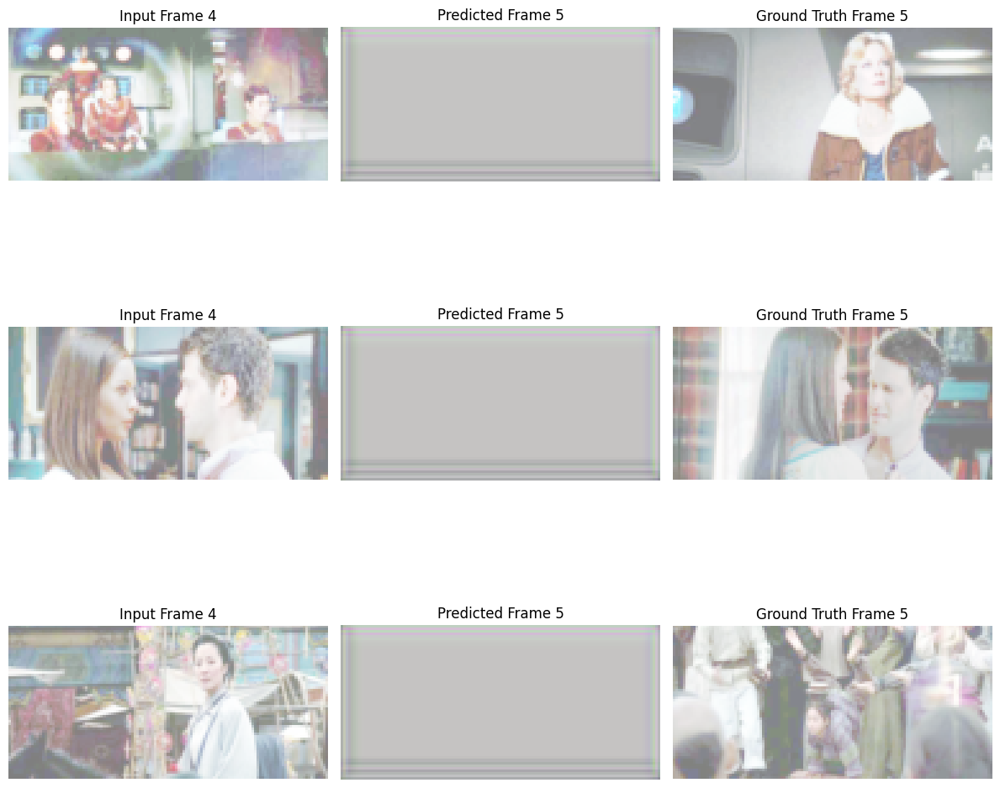

In [22]:

# @title Test and Visualize Results (ADD NEW CELL)

def visualize_results(model, dataloader, num_examples=3):
    """Visualize predictions vs ground truth"""
    model.eval()
    with torch.no_grad():
        frames, descriptions, image_target, _ = next(iter(dataloader))

        # Move to device
        frames = frames[:num_examples].to(device)
        descriptions = descriptions[:num_examples].to(device)
        image_target = image_target[:num_examples].to(device)

        # Predict
        predicted = model(frames, descriptions)

        # Denormalize for display
        def denormalize(img):
            return (img * 0.5) + 0.5  # Assuming images normalized to [-1, 1]

        # Plot
        fig, axes = plt.subplots(num_examples, 3, figsize=(12, 4*num_examples))

        for i in range(num_examples):
            # Original input frame 4
            axes[i, 0].imshow(denormalize(frames[i, -1]).permute(1, 2, 0).cpu())
            axes[i, 0].set_title("Input Frame 4")
            axes[i, 0].axis('off')

            # Predicted frame 5
            axes[i, 1].imshow(denormalize(predicted[i]).permute(1, 2, 0).cpu())
            axes[i, 1].set_title("Predicted Frame 5")
            axes[i, 1].axis('off')

            # Ground truth frame 5
            axes[i, 2].imshow(denormalize(image_target[i]).permute(1, 2, 0).cpu())
            axes[i, 2].set_title("Ground Truth Frame 5")
            axes[i, 2].axis('off')

        plt.tight_layout()
        plt.show()

# Test with validation data
visualize_results(model, val_dataloader, num_examples=3)

In [ ]:
# @title Training tools
criterion_images = nn.L1Loss()
criterion_ctx = nn.MSELoss()
criterion_text = nn.CrossEntropyLoss(ignore_index=tokenizer.convert_tokens_to_ids(tokenizer.pad_token))
optimizer = torch.optim.Adam(sequence_predictor.parameters(), lr=0.001)

Validation on training dataset
----------------


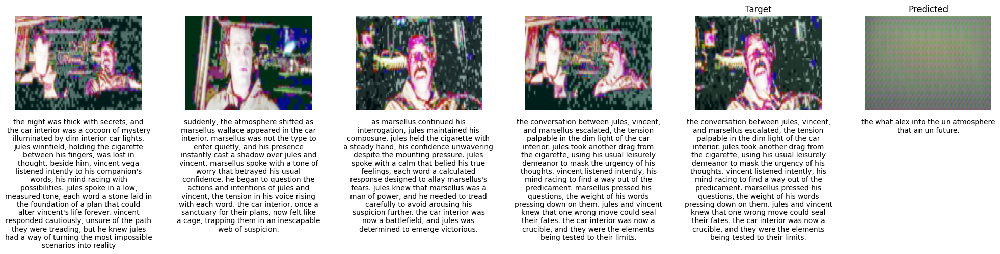

Validation on validation dataset
----------------


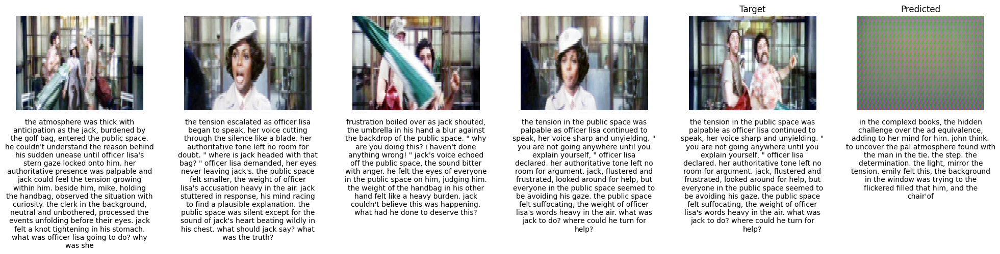

Epoch [1/5], Loss: 8.6918
Checkpoint saved to Google Drive: /content/gdrive/MyDrive/DL_Checkpoints/sequence_predictor.pth at epoch 0
Validation on training dataset
----------------


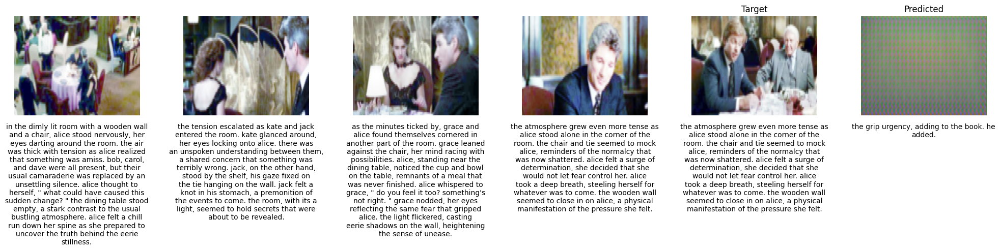

Validation on validation dataset
----------------


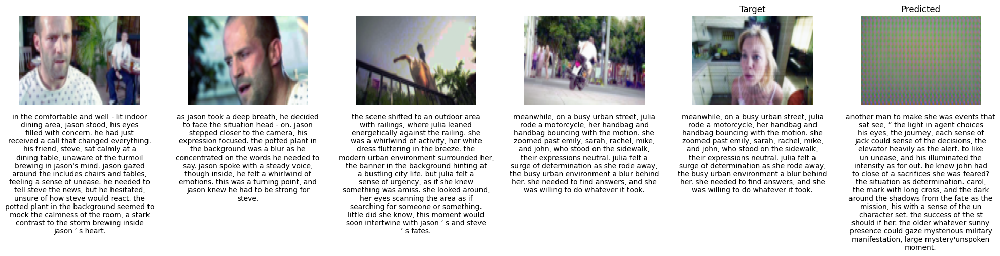

Epoch [2/5], Loss: 8.6906
Validation on training dataset
----------------


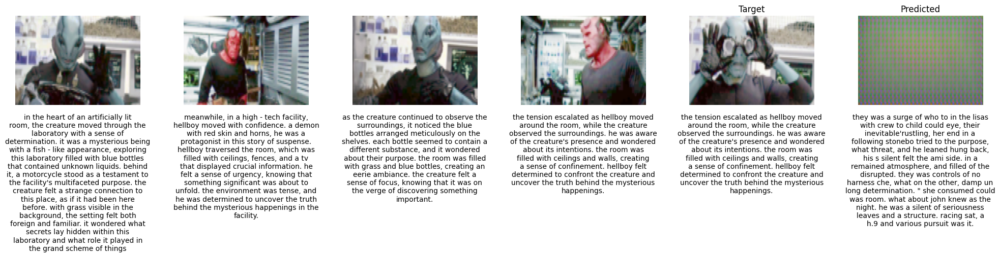

Validation on validation dataset
----------------


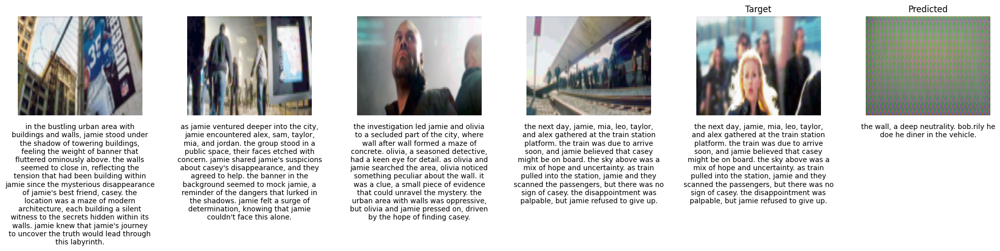

Epoch [3/5], Loss: 8.6878


In [ ]:
# # @title CPU-Optimized Training Loop with Cross-Modal Attention

# import torch
# import matplotlib.pyplot as plt

# # CPU optimizations
# torch.set_num_threads(4)  # Adjust based on your CPU cores

# # Training setup
# sequence_predictor.train()
# losses = []

# for epoch in range(N_EPOCHS):
#     running_loss = 0.0

#     for frames, descriptions, image_target, text_target in train_dataloader:
#         # No .to(device) needed on CPU

#         # Forward pass (assuming your model now uses cross-modal attention internally)
#         pred_image_content, pred_image_context, predicted_text_logits_k, _, _ = \
#             sequence_predictor(frames, descriptions, text_target)

#         # Computing losses
#         # Loss for image reconstruction
#         loss_im = criterion_images(pred_image_content, image_target)
#         # NEW: Add perceptual loss
#         loss_perceptual = perceptual_loss(pred_image_content, image_target)


#         # Loss for the average pattern the images contain
#         mu_global = frames.mean(dim=[0, 1])
#         mu_global = mu_global.unsqueeze(0).expand_as(pred_image_context)
#         loss_context = criterion_ctx(pred_image_context, mu_global)

#         # Loss function for the text prediction
#         prediction_flat = predicted_text_logits_k.reshape(-1, tokenizer.vocab_size)
#         target_labels = text_target.squeeze(1)[:, 1:]  # Slice to get [8, 119]
#         target_flat = target_labels.reshape(-1)
#         loss_text = criterion_text(prediction_flat, target_flat)

#         # Combining the losses
#         loss = loss_im + loss_text + 0.2 * loss_context
#         # Combining the losses
#         loss = 0.5*loss_im + 1.0*loss_perceptual + loss_text + 0.2*loss_context


#         # Optimizing
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         running_loss += loss.item() * frames.size(0)

#     # Checking model performance on validation set
#     sequence_predictor.eval()
#     with torch.no_grad():  # Added for CPU memory efficiency
#         print("Validation on training dataset")
#         print("----------------")
#         validation(sequence_predictor, train_dataloader)
#         print("Validation on validation dataset")
#         print("----------------")
#         validation(sequence_predictor, val_dataloader)
#     sequence_predictor.train()

#     # Calculate epoch loss
#     epoch_loss = running_loss / len(train_dataloader.dataset)
#     losses.append(epoch_loss)
#     print(f'Epoch [{epoch+1}/{N_EPOCHS}], Loss: {epoch_loss:.4f}')

#     if epoch % 5 == 0:
#         save_checkpoint_to_drive(
#             sequence_predictor, optimizer, epoch, epoch_loss,
#             filename=f"sequence_predictor.pth"
#         )

# # Plot training loss
# plt.figure(figsize=(10, 5))
# plt.plot(losses, linewidth=2)
# plt.xlabel('Epoch', fontsize=12)
# plt.ylabel('Loss', fontsize=12)
# plt.title('Training Loss with Cross-Modal Attention + Perceptual loss', fontsize=14)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# print(f"\nTraining complete! Final loss: {losses[-1]:.4f}")

Validation on training dataset
----------------


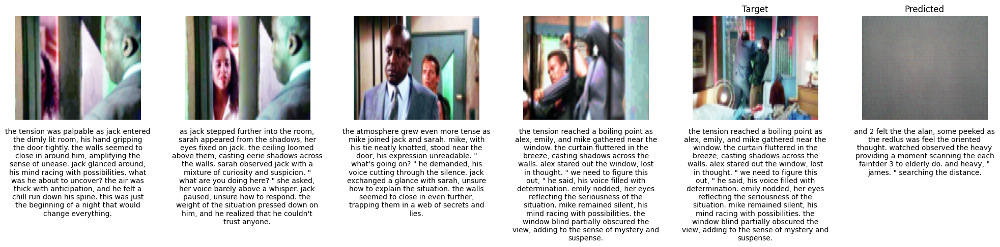

Validation on validation dataset
----------------


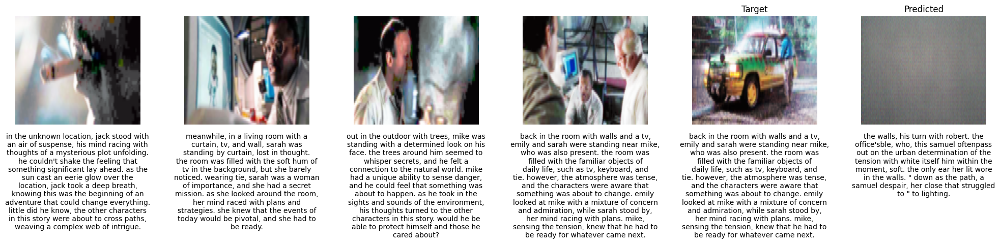

Epoch [1/5], Loss: 5.1787
Checkpoint saved to Google Drive: /content/gdrive/MyDrive/DL_Checkpoints/sequence_predictor.pth at epoch 0
Validation on training dataset
----------------


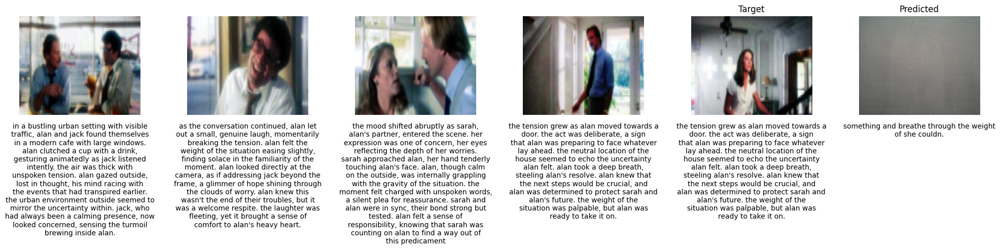

Validation on validation dataset
----------------


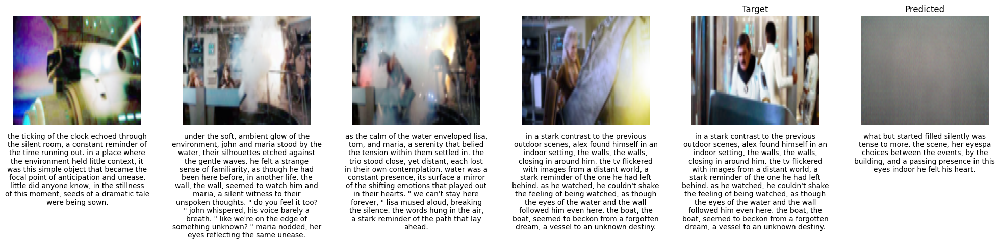

Epoch [2/5], Loss: 5.1714
Validation on training dataset
----------------


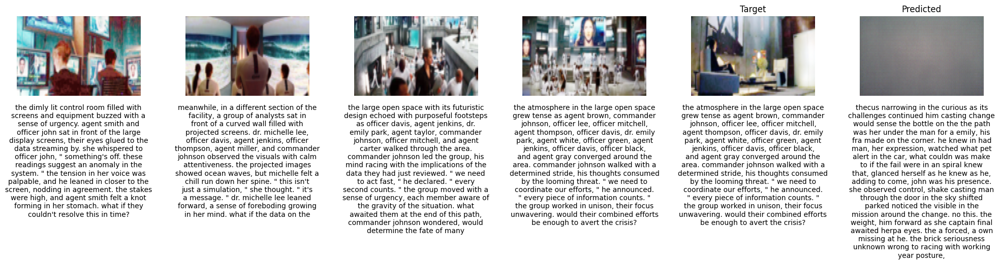

Validation on validation dataset
----------------


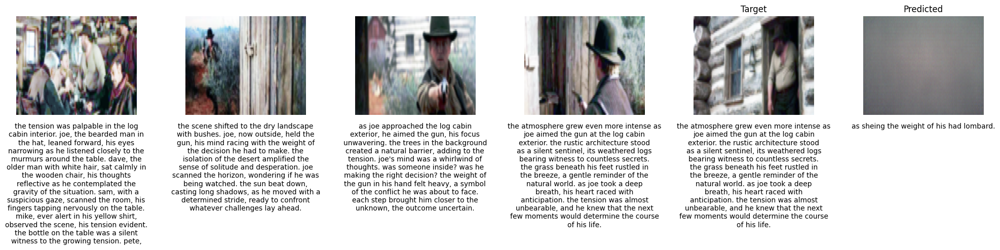

Epoch [3/5], Loss: 5.1711
Validation on training dataset
----------------


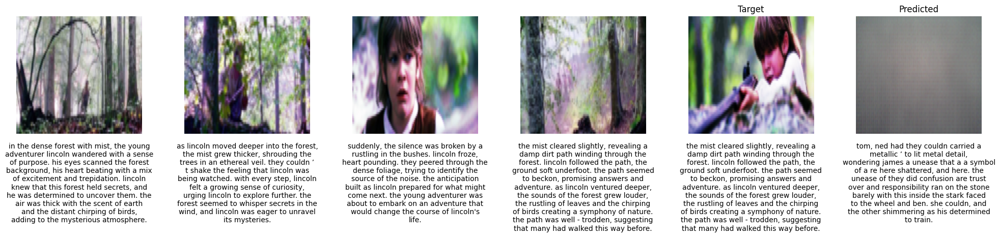

Validation on validation dataset
----------------


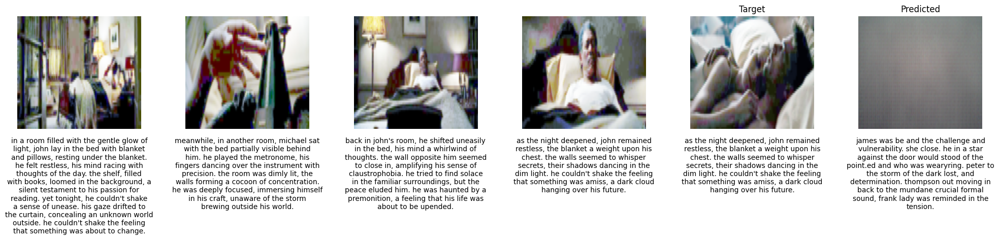

Epoch [4/5], Loss: 5.1716
Validation on training dataset
----------------


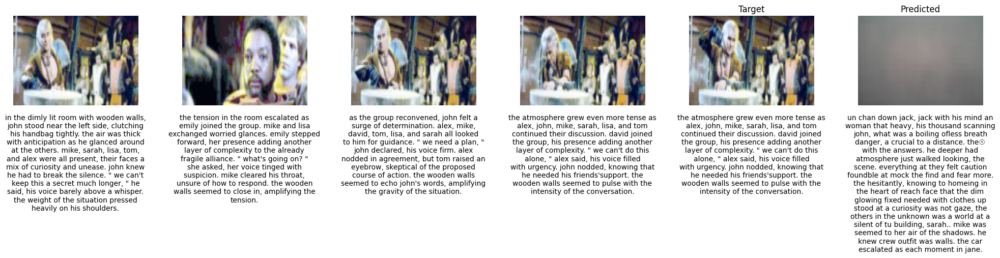

Validation on validation dataset
----------------


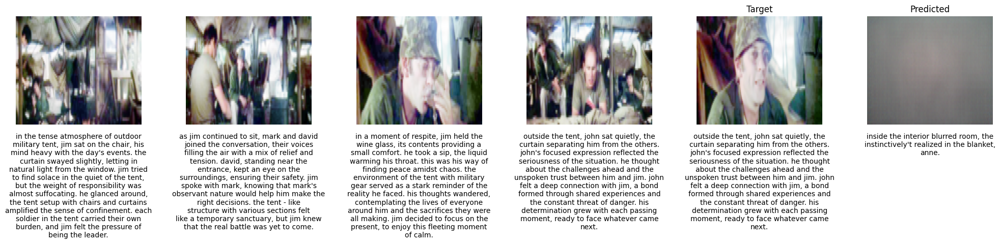

Epoch [5/5], Loss: 5.1715


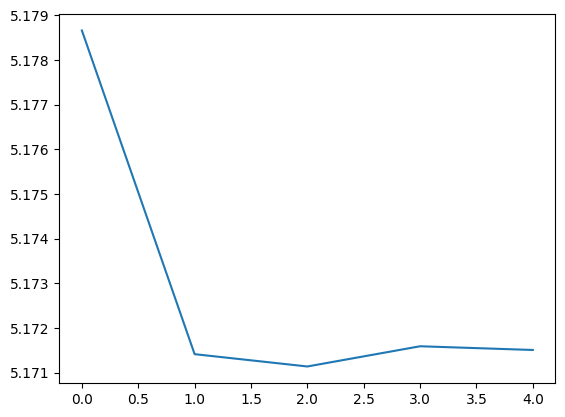

In [ ]:
# @title Training loop for the sequence predictor
# Instantiate the model, define loss and optimizer

sequence_predictor.train()
losses = []

for epoch in range(N_EPOCHS):

    running_loss = 0.0
    for frames, descriptions, image_target, text_target  in train_dataloader:

      # Send images and tokens to the GPU
      descriptions = descriptions.to(device)
      frames = frames.to(device)
      image_target = image_target.to(device)
      text_target = text_target.to(device)
      # Predictions from our model
      pred_image_content, pred_image_context, predicted_text_logits_k, _, _ = sequence_predictor(frames, descriptions, text_target)
      # Computing losses
      # Loss for image reconstruction
      loss_im = criterion_images(pred_image_content, image_target)
      # Loss for the average pattern the images contain
      mu_global = frames.mean(dim=[0, 1])
      mu_global = mu_global.unsqueeze(0).expand_as(pred_image_context)
      loss_context = criterion_ctx(pred_image_context, mu_global)
      # Loss function for the text prediction
      prediction_flat = predicted_text_logits_k.reshape(-1, tokenizer.vocab_size)
      target_labels = text_target.squeeze(1)[:, 1:] # Slice to get [8, 119]
      target_flat = target_labels.reshape(-1)
      loss_text = criterion_text(prediction_flat, target_flat)
      # Combining the losses
      loss = loss_im + loss_text + 0.2*loss_context
      # Optimizing
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      running_loss += loss.item() * frames.size(0)

    # checking model performance on validation set
    sequence_predictor.eval()
    print("Validation on training dataset")
    print( "----------------")
    validation( sequence_predictor, train_dataloader )
    print("Validation on validation dataset")
    print( "----------------")
    validation( sequence_predictor, val_dataloader)
    sequence_predictor.train()

    # scheduler.step()
    epoch_loss = running_loss / len(train_dataloader.dataset)
    losses.append(epoch_loss)
    print(f'Epoch [{epoch+1}/{N_EPOCHS}], Loss: {epoch_loss:.4f}')

    if epoch % 5 == 0:
      save_checkpoint_to_drive(sequence_predictor, optimizer, epoch, epoch_loss, filename=f"sequence_predictor.pth")

# Do better plots
plt.plot(losses)
plt.show()


In [ ]:
# @title Example text reconstruction task

# Don't forget to unfreeze the model!
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(text_autoencoder.parameters(), lr=0.001)

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.convert_tokens_to_ids(tokenizer.pad_token))
N_EPOCHS = 5

for epoch in range(N_EPOCHS):
    text_autoencoder.train()
    epoch_loss = 0
    for description in text_dataloader:
        # Move the "sentences" to device
        input_ids = tokenizer(description, return_tensors="pt",  padding=True, truncation=True).input_ids
        input_ids = input_ids.to(device)

        # zero the grad, then forward pass
        optimizer.zero_grad()
        outputs = text_autoencoder(input_ids, input_ids)
        # compute the loss: compare 3D logits to 2D targets
        loss = loss_fn(outputs.reshape(-1, tokenizer.vocab_size), input_ids[:, 1:].reshape(-1))
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch+1}/{N_EPOCHS}; Avg loss {epoch_loss/len(text_dataloader)}; Latest loss {loss.item()}")
    torch.save(text_autoencoder.state_dict(), f"seq2seq-epoch-{epoch+1}.pth")

# # saving checkpoint to drive
save_checkpoint_to_drive(text_autoencoder, optimizer, 3*N_EPOCHS, loss, filename = "text_autoencoder.pth")

In [ ]:
# @title Image reonstruction task

# To-Do: Use previous labs if you want to pretrain your visual encoder

# **Appendix**

This code computes the average images in case you want to use them. Notice that the average should be all zeros!

In [ ]:
# @title Computing and showing average images
N = 1000
H, W = 60, 125

# Tensors to accumulate sum (for mean) and sum of squares (for variance)
avg_images = [torch.zeros((3, H, W)) for _ in range(5)]
sum_sq_diff = [torch.zeros((3, H, W)) for _ in range(5)] # Placeholder for variance numerator
transform = transforms.Compose([transforms.ToTensor()])

# --- First Pass: Calculate the Sum (for Mean) ---
print("Starting Pass 1: Calculating Mean...")

for i in range(N):
    # Process sequence i
    sequence = train_dataset[i]["images"]

    for j in range(5):
        image = transform(sequence[j])
        avg_images[j] += image # Sum for mean

# Final step for mean
for j in range(5):
    avg_images[j] /= N

print("Starting Pass 2: Calculating Variance...")

for i in range(N):
    # Process sequence i
    sequence = train_dataset[i]["images"]

    for j in range(5):
        image = transform(sequence[j])

        # Calculate (Image - Mean)^2
        # Note: We detach the mean from the computation graph if it were being trained,
        # but here we're just using it as a fixed statistical value.
        diff = image - avg_images[j]
        sum_sq_diff[j] += diff * diff # Element-wise squaring

# --- Final step for Standard Deviation ---
std_images = []
for j in range(5):
    # Variance = Sum of Squared Differences / N
    variance = sum_sq_diff[j] / N

    # Standard Deviation = sqrt(Variance)
    std_dev = torch.sqrt(variance)
    std_images.append(std_dev)

print("Computation Complete. std_images is a list of 5 tensors (3x60x125).")
# You now have the 5 tensors you need for normalization (mean and std).

fig, ax = plt.subplots(1,5, figsize=(15,5))
for i in range(5):
  avg_image = avg_images[i]

  # Printing range of avg_image
  print(torch.min(avg_image), torch.max(avg_image))

  avg_imagen = (avg_image - torch.min(avg_image))/(torch.max(avg_image) - torch.min(avg_image))
  show_image(ax[i], avg_imagen)

# Create a matrix of images with the differences between avg_images
fig, ax = plt.subplots(5,5, figsize=(15,8))

for i in range(5):
  for j in range(5):
    if i == j:
      avg_image = avg_images[i]
      avg_imagen = (avg_image - torch.min(avg_image))/(torch.max(avg_image) - torch.min(avg_image))
      show_image(ax[i,j], avg_imagen)
    else:
      diff = avg_images[i] - avg_images[j]
      diff = (diff - torch.min(diff))/(torch.max(diff) - torch.min(diff))
      show_image(ax[i,j], diff)
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])
plt.tight_layout()
plt.subplots_adjust(
    wspace=0, # Set horizontal space to zero
    hspace=0  # Set vertical space to zero
)